In [1]:
# This will make plot outputs appear within the notebook.
%matplotlib inline 
import numpy as np                       # library for linear algebra
import pandas as pd                      # library for data processing
import matplotlib.pyplot as plt          # library for matplotlib's plotting framework
import seaborn as sns                    # library for making statistical graphics in Python

import warnings
warnings.filterwarnings('ignore')        # For warning control


import folium
import plotly as py
import plotly.graph_objs as go

#from plotly.plotly import iplot

#import plotly.offline as py
#plotly.offline.init_notebook_mode()

ModuleNotFoundError: No module named 'folium'

In [2]:
import os
myfile = ['DDproduct_a.csv']
for filename in myfile:
    print(os.path.join('C:\\Users\\ABHIJITH\\DSIAabhi\\data', filename))    

C:\Users\ABHIJITH\DSIAabhi\data/DDproduct_a.csv


In [3]:
# Load the product dataset
# point 1
try:
    p_csv = '../data/DDproduct_a.csv'
    df_product_a = pd.read_csv(p_csv, index_col = 0)
    print ("Product_a dataset has {} samples with {} features each.".format(*df_product_a.shape))
except:
    print ("Dataset could not be loaded. Is the dataset missing?")

Product_a dataset has 18249 samples with 13 features each.


In [4]:
df_product_a.info()
# clean data before proceeding...null etc

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18249 entries, 0 to 11
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date_w     18249 non-null  object 
 1   price      18249 non-null  float64
 2   total_vol  18249 non-null  float64
 3   plu1       18249 non-null  float64
 4   plu2       18249 non-null  float64
 5   plu3       18249 non-null  float64
 6   bags_t     18249 non-null  float64
 7   bags_s     18249 non-null  float64
 8   bags_l     18249 non-null  float64
 9   bags_lx    18249 non-null  float64
 10  type       18249 non-null  object 
 11  year       18249 non-null  int64  
 12  location   18249 non-null  object 
dtypes: float64(9), int64(1), object(3)
memory usage: 1.9+ MB


In [5]:
df_product_a.head(10)

,date_w,price,total_vol,plu1,plu2,plu3,bags_t,bags_s,bags_l,bags_lx,type,year,location
0,2016-12-24,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,A,2015,Albany
1,2016-12-17,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,A,2015,Albany
2,2016-12-10,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,A,2015,Albany
3,2016-12-03,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,A,2015,Albany
4,2016-11-26,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,A,2015,Albany
5,2016-11-19,1.26,55979.78,1184.27,48067.99,43.61,6683.91,6556.47,127.44,0.0,A,2015,Albany
6,2016-11-12,0.99,83453.76,1368.92,73672.72,93.26,8318.86,8196.81,122.05,0.0,A,2015,Albany
7,2016-11-05,0.98,109428.33,703.75,101815.36,80.00,6829.22,6266.85,562.37,0.0,A,2015,Albany
8,2016-10-29,1.02,99811.42,1022.15,87315.57,85.34,11388.36,11104.53,283.83,0.0,A,2015,Albany
9,2016-10-22,1.07,74338.76,842.40,64757.44,113.00,8625.92,8061.47,564.45,0.0,A,2015,Albany


In [6]:
# checking duplicate rows
np.sum(df_product_a.duplicated())

0

In [7]:
# Checking columns having null values
df_product_a.isna().sum()

date_w       0
price        0
total_vol    0
plu1         0
plu2         0
plu3         0
bags_t       0
bags_s       0
bags_l       0
bags_lx      0
type         0
year         0
location     0
dtype: int64

In [8]:
# point 2
df_product_a['date_w'] =  pd.to_datetime(df_product_a['date_w'])

In [9]:
df_product_a.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18249 entries, 0 to 11
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_w     18249 non-null  datetime64[ns]
 1   price      18249 non-null  float64       
 2   total_vol  18249 non-null  float64       
 3   plu1       18249 non-null  float64       
 4   plu2       18249 non-null  float64       
 5   plu3       18249 non-null  float64       
 6   bags_t     18249 non-null  float64       
 7   bags_s     18249 non-null  float64       
 8   bags_l     18249 non-null  float64       
 9   bags_lx    18249 non-null  float64       
 10  type       18249 non-null  object        
 11  year       18249 non-null  int64         
 12  location   18249 non-null  object        
dtypes: datetime64[ns](1), float64(9), int64(1), object(2)
memory usage: 1.9+ MB


In [5]:
df_product_a.date_w

0    2016-12-24
1    2016-12-17
2    2016-12-10
3    2016-12-03
4    2016-11-26
        ...    
7    2019-02-02
8    2019-01-26
9    2019-01-19
10   2019-01-12
11   2019-01-05
Name: date_w, Length: 18249, dtype: datetime64[ns]

In [10]:
# point 3
df_product_a['year'] = df_product_a['date_w'].dt.year

In [7]:
df_product_a.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18249 entries, 0 to 11
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_w     18249 non-null  datetime64[ns]
 1   price      18249 non-null  float64       
 2   total_vol  18249 non-null  float64       
 3   plu1       18249 non-null  float64       
 4   plu2       18249 non-null  float64       
 5   plu3       18249 non-null  float64       
 6   bags_t     18249 non-null  float64       
 7   bags_s     18249 non-null  float64       
 8   bags_l     18249 non-null  float64       
 9   bags_lx    18249 non-null  float64       
 10  type       18249 non-null  object        
 11  year       18249 non-null  int64         
 12  location   18249 non-null  object        
dtypes: datetime64[ns](1), float64(9), int64(1), object(2)
memory usage: 1.9+ MB


In [11]:
# group by year
df_product_anew=df_product_a.groupby('year').max()['price'].values

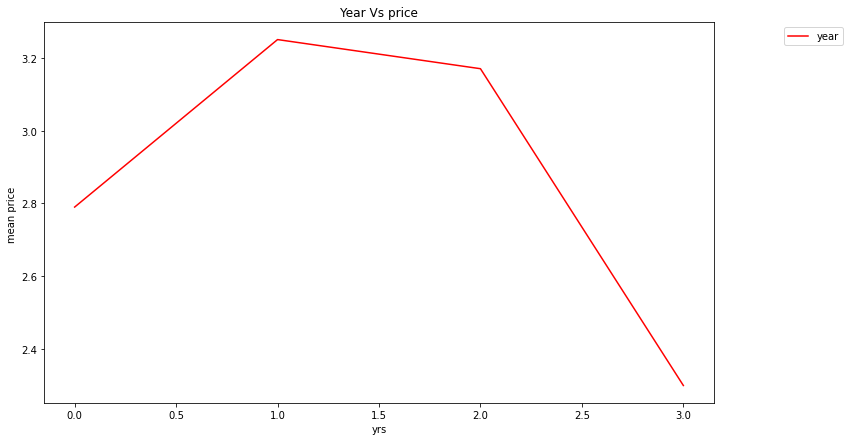

In [12]:
# plot after grouping
plt.figure(figsize=(12,7))
plt.plot(df_product_anew ,color='red', label="year")

plt.xlabel('yrs')
plt.ylabel('mean price ')
plt.title('Year Vs price')
plt.legend(loc='upper right', bbox_to_anchor=(1.2,1))
plt.show()

In [10]:
# point 4  (work in progress)
df_product_a.describe().T

,count,mean,std,min,25%,50%,75%,max
price,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25
total_vol,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52
plu1,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17
plu2,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61
plu3,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11
bags_t,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37
bags_s,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80
bags_l,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61
bags_lx,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65
year,18249.0,2017.136062,9.417248e-01,2016.00,2016.00,2017.00,2018.00,2019.00


In [35]:
# creating df_stats as per the requirement
df_stats = df_product_a.describe().T

In [36]:
df_stats['field_name'] = df_stats.index
df_stats

,count,mean,std,min,25%,50%,75%,max,field_name
price,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25,price
total_vol,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52,total_vol
plu1,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17,plu1
plu2,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61,plu2
plu3,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11,plu3
bags_t,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37,bags_t
bags_s,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80,bags_s
bags_l,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61,bags_l
bags_lx,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65,bags_lx
year,18249.0,2017.136062,9.417248e-01,2016.00,2016.00,2017.00,2018.00,2019.00,year


In [37]:
df_stats['median'] = df_product_a.median()
df_stats

,count,mean,std,min,25%,50%,75%,max,field_name,median
price,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25,price,1.37
total_vol,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52,total_vol,107376.76
plu1,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17,plu1,8645.30
plu2,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61,plu2,29061.02
plu3,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11,plu3,184.99
bags_t,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37,bags_t,39743.83
bags_s,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80,bags_s,26362.82
bags_l,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61,bags_l,2647.71
bags_lx,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65,bags_lx,0.00
year,18249.0,2017.136062,9.417248e-01,2016.00,2016.00,2017.00,2018.00,2019.00,year,2017.00


In [38]:
df_stats['variance'] = df_product_a.var()
df_stats

,count,mean,std,min,25%,50%,75%,max,field_name,median,variance
price,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25,price,1.37,1.621484e-01
total_vol,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52,total_vol,107376.76,1.192698e+13
plu1,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17,plu1,8645.30,1.600197e+12
plu2,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61,plu2,29061.02,1.449906e+12
plu3,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11,plu3,184.99,1.154853e+10
bags_t,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37,bags_t,39743.83,9.726741e+11
bags_s,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80,bags_s,26362.82,5.567824e+11
bags_l,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61,bags_l,2647.71,5.951939e+10
bags_lx,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65,bags_lx,0.00,3.130385e+08
year,18249.0,2017.136062,9.417248e-01,2016.00,2016.00,2017.00,2018.00,2019.00,year,2017.00,8.868455e-01


In [39]:
df_stats['skewness'] = df_product_a.skew()
df_stats

,count,mean,std,min,25%,50%,75%,max,field_name,median,variance,skewness
price,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25,price,1.37,1.621484e-01,0.580303
total_vol,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52,total_vol,107376.76,1.192698e+13,9.007687
plu1,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17,plu1,8645.30,1.600197e+12,8.648220
plu2,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61,plu2,29061.02,1.449906e+12,8.942466
plu3,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11,plu3,184.99,1.154853e+10,10.159396
bags_t,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37,bags_t,39743.83,9.726741e+11,9.756072
bags_s,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80,bags_s,26362.82,5.567824e+11,9.540660
bags_l,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61,bags_l,2647.71,5.951939e+10,9.796455
bags_lx,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65,bags_lx,0.00,3.130385e+08,13.139751
year,18249.0,2017.136062,9.417248e-01,2016.00,2016.00,2017.00,2018.00,2019.00,year,2017.00,8.868455e-01,0.236723


In [40]:
df_stats['IQR'] = df_stats['75%'] - df_stats['25%']
df_stats

,count,mean,std,min,25%,50%,75%,max,field_name,median,variance,skewness,IQR
price,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25,price,1.37,1.621484e-01,0.580303,0.56
total_vol,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52,total_vol,107376.76,1.192698e+13,9.007687,422123.71
plu1,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17,plu1,8645.30,1.600197e+12,8.648220,110166.13
plu2,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61,plu2,29061.02,1.449906e+12,8.942466,147198.08
plu3,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11,plu3,184.99,1.154853e+10,10.159396,6243.42
bags_t,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37,bags_t,39743.83,9.726741e+11,9.756072,105694.73
bags_s,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80,bags_s,26362.82,5.567824e+11,9.540660,80488.25
bags_l,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61,bags_l,2647.71,5.951939e+10,9.796455,21901.78
bags_lx,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65,bags_lx,0.00,3.130385e+08,13.139751,132.50
year,18249.0,2017.136062,9.417248e-01,2016.00,2016.00,2017.00,2018.00,2019.00,year,2017.00,8.868455e-01,0.236723,2.00


In [41]:
df_stats['kurtosis'] = df_product_a.kurtosis()
df_stats

,count,mean,std,min,25%,50%,75%,max,field_name,median,variance,skewness,IQR,kurtosis
price,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25,price,1.37,1.621484e-01,0.580303,0.56,0.325196
total_vol,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52,total_vol,107376.76,1.192698e+13,9.007687,422123.71,92.104458
plu1,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17,plu1,8645.30,1.600197e+12,8.648220,110166.13,86.809113
plu2,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61,plu2,29061.02,1.449906e+12,8.942466,147198.08,91.949022
plu3,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11,plu3,184.99,1.154853e+10,10.159396,6243.42,132.563441
bags_t,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37,bags_t,39743.83,9.726741e+11,9.756072,105694.73,112.272156
bags_s,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80,bags_s,26362.82,5.567824e+11,9.540660,80488.25,107.012885
bags_l,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61,bags_l,2647.71,5.951939e+10,9.796455,21901.78,117.999481
bags_lx,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65,bags_lx,0.00,3.130385e+08,13.139751,132.50,233.602612
year,18249.0,2017.136062,9.417248e-01,2016.00,2016.00,2017.00,2018.00,2019.00,year,2017.00,8.868455e-01,0.236723,2.00,-1.027578


In [42]:
df_stats.drop(["field_name"], axis = 1, inplace = True)
full = df_stats
df_stats['10%'] = np.percentile(full,10)
df_stats

,count,mean,std,min,25%,50%,75%,max,median,variance,skewness,IQR,kurtosis,10%
price,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25,1.37,1.621484e-01,0.580303,0.56,0.325196,0.229266
total_vol,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52,107376.76,1.192698e+13,9.007687,422123.71,92.104458,0.229266
plu1,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17,8645.30,1.600197e+12,8.648220,110166.13,86.809113,0.229266
plu2,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61,29061.02,1.449906e+12,8.942466,147198.08,91.949022,0.229266
plu3,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11,184.99,1.154853e+10,10.159396,6243.42,132.563441,0.229266
bags_t,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37,39743.83,9.726741e+11,9.756072,105694.73,112.272156,0.229266
bags_s,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80,26362.82,5.567824e+11,9.540660,80488.25,107.012885,0.229266
bags_l,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61,2647.71,5.951939e+10,9.796455,21901.78,117.999481,0.229266
bags_lx,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65,0.00,3.130385e+08,13.139751,132.50,233.602612,0.229266
year,18249.0,2017.136062,9.417248e-01,2016.00,2016.00,2017.00,2018.00,2019.00,2017.00,8.868455e-01,0.236723,2.00,-1.027578,0.229266


In [43]:
df_stats['20%'] = np.percentile(full,20)
df_stats

,count,mean,std,min,25%,50%,75%,max,median,variance,skewness,IQR,kurtosis,10%,20%
price,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25,1.37,1.621484e-01,0.580303,0.56,0.325196,0.229266,0.576242
total_vol,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52,107376.76,1.192698e+13,9.007687,422123.71,92.104458,0.229266,0.576242
plu1,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17,8645.30,1.600197e+12,8.648220,110166.13,86.809113,0.229266,0.576242
plu2,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61,29061.02,1.449906e+12,8.942466,147198.08,91.949022,0.229266,0.576242
plu3,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11,184.99,1.154853e+10,10.159396,6243.42,132.563441,0.229266,0.576242
bags_t,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37,39743.83,9.726741e+11,9.756072,105694.73,112.272156,0.229266,0.576242
bags_s,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80,26362.82,5.567824e+11,9.540660,80488.25,107.012885,0.229266,0.576242
bags_l,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61,2647.71,5.951939e+10,9.796455,21901.78,117.999481,0.229266,0.576242
bags_lx,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65,0.00,3.130385e+08,13.139751,132.50,233.602612,0.229266,0.576242
year,18249.0,2017.136062,9.417248e-01,2016.00,2016.00,2017.00,2018.00,2019.00,2017.00,8.868455e-01,0.236723,2.00,-1.027578,0.229266,0.576242


In [44]:
df_stats['30%'] = np.percentile(full,30)
df_stats

,count,mean,std,min,25%,50%,75%,max,median,variance,skewness,IQR,kurtosis,10%,20%,30%
price,18249.0,1.405978,4.026766e-01,0.44,1.10,1.37,1.66,3.25,1.37,1.621484e-01,0.580303,0.56,0.325196,0.229266,0.576242,1.583794
total_vol,18249.0,850644.013009,3.453545e+06,84.56,10838.58,107376.76,432962.29,62505646.52,107376.76,1.192698e+13,9.007687,422123.71,92.104458,0.229266,0.576242,1.583794
plu1,18249.0,293008.424531,1.264989e+06,0.00,854.07,8645.30,111020.20,22743616.17,8645.30,1.600197e+12,8.648220,110166.13,86.809113,0.229266,0.576242,1.583794
plu2,18249.0,295154.568356,1.204120e+06,0.00,3008.78,29061.02,150206.86,20470572.61,29061.02,1.449906e+12,8.942466,147198.08,91.949022,0.229266,0.576242,1.583794
plu3,18249.0,22839.735993,1.074641e+05,0.00,0.00,184.99,6243.42,2546439.11,184.99,1.154853e+10,10.159396,6243.42,132.563441,0.229266,0.576242,1.583794
bags_t,18249.0,239639.202060,9.862424e+05,0.00,5088.64,39743.83,110783.37,19373134.37,39743.83,9.726741e+11,9.756072,105694.73,112.272156,0.229266,0.576242,1.583794
bags_s,18249.0,182194.686696,7.461785e+05,0.00,2849.42,26362.82,83337.67,13384586.80,26362.82,5.567824e+11,9.540660,80488.25,107.012885,0.229266,0.576242,1.583794
bags_l,18249.0,54338.088145,2.439660e+05,0.00,127.47,2647.71,22029.25,5719096.61,2647.71,5.951939e+10,9.796455,21901.78,117.999481,0.229266,0.576242,1.583794
bags_lx,18249.0,3106.426507,1.769289e+04,0.00,0.00,0.00,132.50,551693.65,0.00,3.130385e+08,13.139751,132.50,233.602612,0.229266,0.576242,1.583794
year,18249.0,2017.136062,9.417248e-01,2016.00,2016.00,2017.00,2018.00,2019.00,2017.00,8.868455e-01,0.236723,2.00,-1.027578,0.229266,0.576242,1.583794


In [14]:
# point 7
df_analysis  = df_product_a
df_analysis['new_total_vol'] = df_analysis['plu1'] + df_analysis['plu2'] + df_analysis['plu3'] + df_analysis['bags_t'] 
df_analysisnew = df_analysis[['date_w','total_vol','new_total_vol']]
df_analysisnew

,date_w,total_vol,new_total_vol
0,2016-12-24,64236.62,64236.62
1,2016-12-17,54876.98,54876.98
2,2016-12-10,118220.22,118220.22
3,2016-12-03,78992.15,78992.15
4,2016-11-26,51039.60,51039.60
...,...,...,...
7,2019-02-02,17074.83,17074.83
8,2019-01-26,13888.04,13888.04
9,2019-01-19,13766.76,13766.76
10,2019-01-12,16205.22,16205.22


In [15]:
df_analysis.head()

,date_w,price,total_vol,plu1,plu2,plu3,bags_t,bags_s,bags_l,bags_lx,type,year,location,new_total_vol
0,2016-12-24,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,A,2016,Albany,64236.62
1,2016-12-17,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,A,2016,Albany,54876.98
2,2016-12-10,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,A,2016,Albany,118220.22
3,2016-12-03,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,A,2016,Albany,78992.15
4,2016-11-26,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,A,2016,Albany,51039.60


In [50]:
df_analysisnew['diff'] = df_analysisnew['new_total_vol'] - df_analysisnew['total_vol']
df_analysisnew

,date_w,total_vol,new_total_vol,diff
0,2016-12-24,64236.62,64236.62,0.000000e+00
1,2016-12-17,54876.98,54876.98,-7.275958e-12
2,2016-12-10,118220.22,118220.22,0.000000e+00
3,2016-12-03,78992.15,78992.15,1.455192e-11
4,2016-11-26,51039.60,51039.60,0.000000e+00
...,...,...,...,...
7,2019-02-02,17074.83,17074.83,0.000000e+00
8,2019-01-26,13888.04,13888.04,0.000000e+00
9,2019-01-19,13766.76,13766.76,0.000000e+00
10,2019-01-12,16205.22,16205.22,1.818989e-12


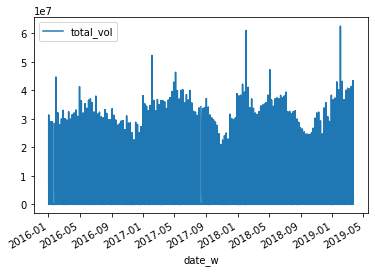

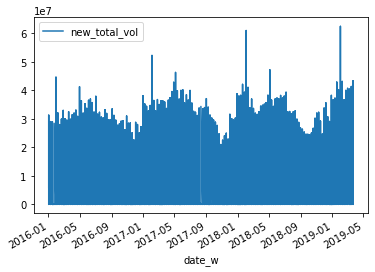

In [16]:
df_analysisnew.plot(x='date_w', y='total_vol')
df_analysisnew.plot(x='date_w', y='new_total_vol')
plt.show()

In [17]:
# point 8
pearsonmatrix = df_product_a.corr(method='pearson')
pearsonmatrix

,price,total_vol,plu1,plu2,plu3,bags_t,bags_s,bags_l,bags_lx,year,new_total_vol
price,1.000000,-0.192752,-0.208317,-0.172928,-0.179446,-0.177088,-0.174730,-0.172940,-0.117592,0.098153,-0.192753
total_vol,-0.192752,1.000000,0.977863,0.974181,0.872202,0.963047,0.967238,0.880640,0.747157,0.016763,1.000000
plu1,-0.208317,0.977863,1.000000,0.926110,0.833389,0.920057,0.925280,0.838645,0.699377,0.003352,0.977863
plu2,-0.172928,0.974181,0.926110,1.000000,0.887855,0.905787,0.916031,0.810015,0.688809,-0.010412,0.974181
plu3,-0.179446,0.872202,0.833389,0.887855,1.000000,0.792314,0.802733,0.698471,0.679861,-0.036882,0.872202
bags_t,-0.177088,0.963047,0.920057,0.905787,0.792314,1.000000,0.994335,0.943009,0.804233,0.071128,0.963047
bags_s,-0.174730,0.967238,0.925280,0.916031,0.802733,0.994335,1.000000,0.902589,0.806845,0.063620,0.967238
bags_l,-0.172940,0.880640,0.838645,0.810015,0.698471,0.943009,0.902589,1.000000,0.710858,0.087067,0.880640
bags_lx,-0.117592,0.747157,0.699377,0.688809,0.679861,0.804233,0.806845,0.710858,1.000000,0.081149,0.747157
year,0.098153,0.016763,0.003352,-0.010412,-0.036882,0.071128,0.063620,0.087067,0.081149,1.000000,0.016762


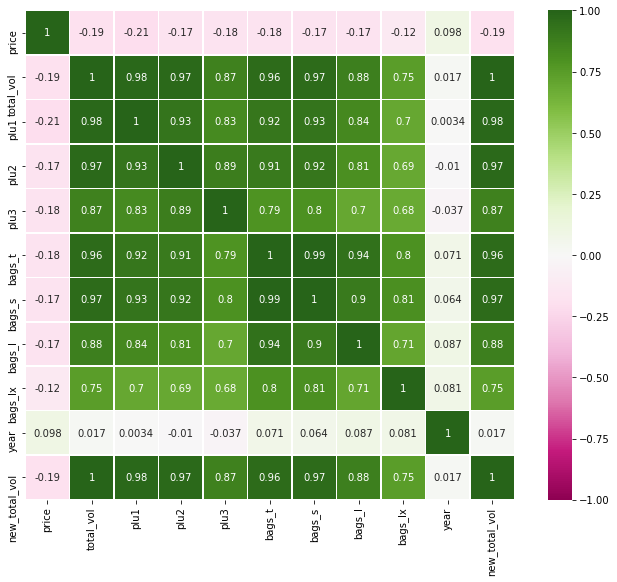

In [18]:
plt.subplots(figsize=(12,9))
sns.heatmap(pearsonmatrix, square=True, annot = True,vmin= -1, vmax= 1, center = 0, linewidth = 0.5, cmap="PiYG")  
plt.show()

In [22]:
# point 9
spearmanmatrix = df_product_a.corr(method='spearman')
spearmanmatrix

,price,total_vol,plu1,plu2,plu3,bags_t,bags_s,bags_l,bags_lx,year
price,1.000000,-0.612239,-0.596170,-0.513732,-0.532825,-0.596972,-0.536403,-0.511142,-0.427207,0.107131
total_vol,-0.612239,1.000000,0.902887,0.940025,0.828223,0.952550,0.925874,0.702067,0.659949,0.085065
plu1,-0.596170,0.902887,1.000000,0.793939,0.754838,0.837121,0.822036,0.638535,0.615535,0.009946
plu2,-0.513732,0.940025,0.793939,1.000000,0.819905,0.856946,0.833764,0.635465,0.628893,0.005847
plu3,-0.532825,0.828223,0.754838,0.819905,1.000000,0.779323,0.780185,0.571869,0.652807,-0.044310
bags_t,-0.596972,0.952550,0.837121,0.856946,0.779323,1.000000,0.961018,0.753044,0.652582,0.207630
bags_s,-0.536403,0.925874,0.822036,0.833764,0.780185,0.961018,1.000000,0.603582,0.641796,0.184355
bags_l,-0.511142,0.702067,0.638535,0.635465,0.571869,0.753044,0.603582,1.000000,0.500590,0.190064
bags_lx,-0.427207,0.659949,0.615535,0.628893,0.652807,0.652582,0.641796,0.500590,1.000000,0.167523
year,0.107131,0.085065,0.009946,0.005847,-0.044310,0.207630,0.184355,0.190064,0.167523,1.000000


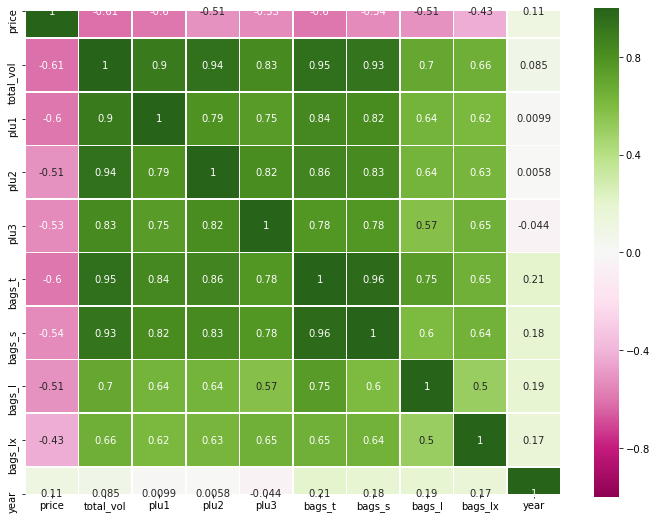

In [23]:
plt.subplots(figsize=(12,9))
sns.heatmap(spearmanmatrix, square=True, annot = True,vmin= -1, vmax= 1, center = 0, linewidth = 0.5, cmap="PiYG")  
plt.show()

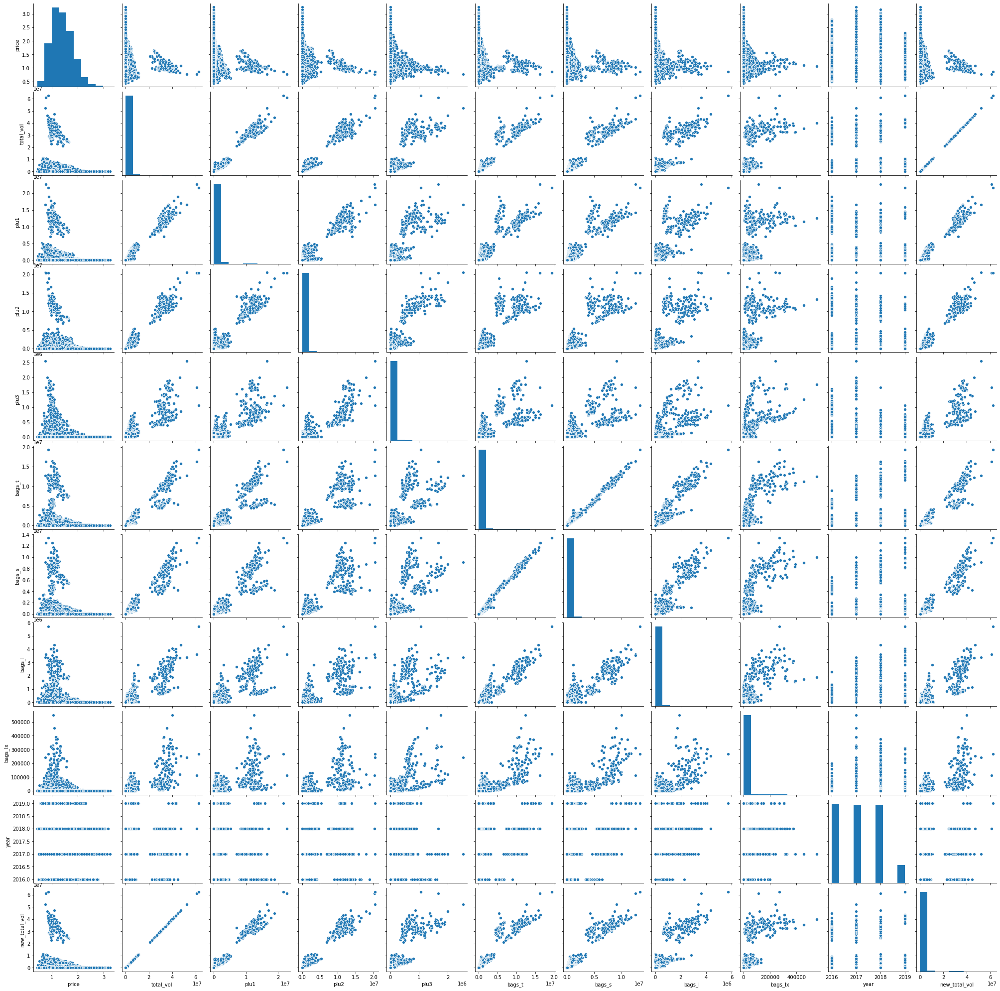

In [19]:
# point 10

df_pp = df_product_a
sns.pairplot(df_pp)
plt.show()

In [6]:
df_product_a['year'].unique()

array([2016, 2017, 2018, 2019], dtype=int64)

In [20]:
df_product_a['location'].unique()

array(['Albany', 'Atlanta', 'BaltimoreWashington', 'Boise', 'Boston',
       'BuffaloRochester', 'California', 'Charlotte', 'Chicago',
       'CincinnatiDayton', 'Columbus', 'DallasFtWorth', 'Denver',
       'Detroit', 'GrandRapids', 'GreatLakes', 'HarrisburgScranton',
       'HartfordSpringfield', 'Houston', 'Indianapolis', 'Jacksonville',
       'LasVegas', 'LosAngeles', 'Louisville', 'MiamiFtLauderdale',
       'Midsouth', 'Nashville', 'NewOrleansMobile', 'NewYork',
       'Northeast', 'NorthernNewEngland', 'Orlando', 'Philadelphia',
       'PhoenixTucson', 'Pittsburgh', 'Plains', 'Portland',
       'RaleighGreensboro', 'RichmondNorfolk', 'Roanoke', 'Sacramento',
       'SanDiego', 'SanFrancisco', 'Seattle', 'SouthCarolina',
       'SouthCentral', 'Southeast', 'Spokane', 'StLouis', 'Syracuse',
       'Tampa', 'TotalUS', 'West', 'WestTexNewMexico'], dtype=object)

In [5]:
df_product_a['type'].unique()

array(['A', 'C'], dtype=object)

In [7]:
df_product_a.head()

,date_w,price,total_vol,plu1,plu2,plu3,bags_t,bags_s,bags_l,bags_lx,type,year,location
0,2016-12-24,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,A,2016,Albany
1,2016-12-17,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,A,2016,Albany
2,2016-12-10,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,A,2016,Albany
3,2016-12-03,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,A,2016,Albany
4,2016-11-26,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,A,2016,Albany


In [21]:
# point 11

df2016 = df_product_a.query('year==2016')
df2017 = df_product_a.query('year==2017')
df2018 = df_product_a.query('year==2018')
df2019 = df_product_a.query('year==2019')

newdata1 = go.Scatter(
                    x = df2016.location,
                    y = df2016.total_vol,
                    mode = "lines",
                    name = "2016",
                    marker = dict(color = 'rgba(255, 112, 255, 0.8)'),
                    text= df2016.price)

newdata2 = go.Scatter(
                    x = df2017.location,
                    y = df2017.total_vol,
                    mode = "lines",
                    name = "2017",
                    marker = dict(color = 'rgba(16, 11, 255, 0.8)'),
                    text= df2016.price)

newdata3 = go.Scatter(
                    x = df2018.location,
                    y = df2018.total_vol,
                    mode = "lines",
                    name = "2018",
                    marker = dict(color = 'rgba(0, 255, 2, 0.8)'),
                    text= df2018.price)

newdata4 = go.Scatter(
                    x = df2019.location,
                    y = df2019.total_vol,
                    mode = "lines",
                    name = "2019",
                    marker = dict(color = 'rgba(112, 11, 112, 0.8)'),
                    text= df2019.price)

data = [newdata1,newdata2,newdata3,newdata4]
layout = dict(title = 'Product a',
              xaxis= dict(title= 'Location',ticklen= 15,zeroline= False),
              yaxis= dict(title= 'Total Volume',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
#iplot(fig)
fig.show()
#py.iplot(fig, filename="file1.html")

NameError: name 'go' is not defined

In [53]:
# point 12

newdata5 = go.Bar(
                x = df_product_a.location,
                y = df_product_a.year,
                name = "location",
                marker = dict(color = 'rgba(255, 174, 255, 0.5)',
                             line=dict(color='rgb(0,0,0)',width=1.5)),
                text = df_product_a.price)

newdata6 = go.Bar(
                x = df_product_a.type,
                y = df_product_a.year,
                name = "type",
                marker = dict(color = 'rgba(255, 255, 128, 0.5)',
                             line=dict(color='rgb(0,0,0)',width=1.5)),
                text = df_product_a.price)

data = [newdata5, newdata6]
layout = go.Layout(barmode = "group")

fig = go.Figure(data = data, layout = layout)
#iplot(fig)
fig.show()
#py.iplot(fig, filename="file2.html")

In [22]:
# point 11
import plotly.express as px

fig11 = px.bar(df_product_a, x='date_w', y='price')
fig11.update_xaxes(rangeslider_visible=True)
fig11.show()

ModuleNotFoundError: No module named 'plotly'

In [7]:
# point 12 
import plotly.express as px

fig11 = px.bar(df_product_a, x='date_w', y='type')
fig11.update_xaxes(rangeslider_visible=True)
fig11.show()

In [23]:
# point 12 testing
import plotly.express as px

fig11 = px.bar(df_product_a, x='date_w', y='price')
fig11.update_xaxes(rangeslider_visible=True)
fig11.show()

ModuleNotFoundError: No module named 'plotly'

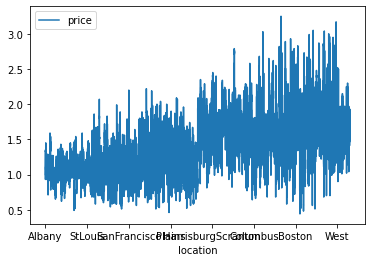

In [4]:
ax = plt.gca()
df_product_a.plot(kind='line',x='location',y='price',ax=ax)
plt.show()

In [54]:
dfgl = df_product_a.groupby('location').mean()
dfgl

,price,total_vol,plu1,plu2,plu3,bags_t,bags_s,bags_l,bags_lx,year,new_total_vol
location,,,,,,,,,,,
Albany,1.561036,4.753787e+04,1.824082e+03,3.762121e+04,162.832337,7.929747e+03,6.647765e+03,1.153496e+03,128.488639,2017.136095,4.753787e+04
Atlanta,1.337959,2.621453e+05,1.461169e+05,3.121851e+04,311.385769,8.449856e+04,5.160573e+04,3.207004e+04,822.786036,2017.136095,2.621453e+05
BaltimoreWashington,1.534231,3.985619e+05,3.565622e+04,2.459829e+05,12466.730976,1.044561e+05,1.009397e+05,2.903985e+03,612.382722,2017.136095,3.985619e+05
Boise,1.348136,4.264257e+04,2.001951e+04,3.461682e+03,3186.787840,1.597459e+04,1.384004e+04,2.103634e+03,30.915207,2017.136095,4.264257e+04
Boston,1.530888,2.877929e+05,4.994610e+03,2.142199e+05,4982.294970,6.359609e+04,5.890659e+04,4.438365e+03,251.124231,2017.136095,2.877929e+05
BuffaloRochester,1.516834,6.793630e+04,1.776671e+03,3.166395e+04,144.335976,3.435134e+04,3.037998e+04,3.729050e+03,242.313432,2017.136095,6.793630e+04
California,1.395325,3.044324e+06,1.180376e+06,1.039915e+06,94204.276746,7.298290e+05,6.778038e+05,3.642585e+04,15599.342929,2017.136095,3.044324e+06
Charlotte,1.606036,1.051939e+05,2.237814e+04,3.662802e+04,11578.467574,3.460930e+04,3.149069e+04,2.912684e+03,205.927781,2017.136095,1.051939e+05
Chicago,1.556775,3.955690e+05,3.208308e+04,2.545190e+05,59069.204290,4.989763e+04,4.377116e+04,5.005547e+03,1120.925178,2017.136095,3.955690e+05


In [36]:
dfgt = df_product_a.groupby('type').mean()
dfgt

,price,total_vol,plu1,plu2,plu3,bags_t,bags_s,bags_l,bags_lx,year
type,,,,,,,,,,
A,1.158040,1.653213e+06,578611.649925,574805.318859,45405.796798,454390.130901,346721.795885,101457.698855,6210.635065,2017.136095
C,1.653999,4.781121e+04,7311.281600,15411.857724,266.254582,24817.654696,17613.474543,7202.982659,1.197164,2017.136030


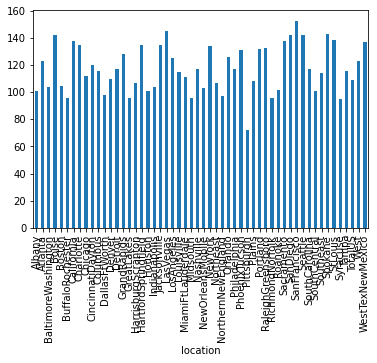

In [8]:
df_product_a.groupby('location')['price'].nunique().plot(kind='bar')
plt.show()

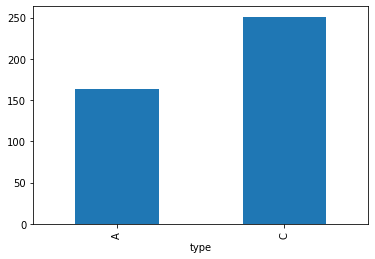

In [18]:
df_product_a.groupby('type')['price'].nunique().plot(kind='bar')
plt.show()

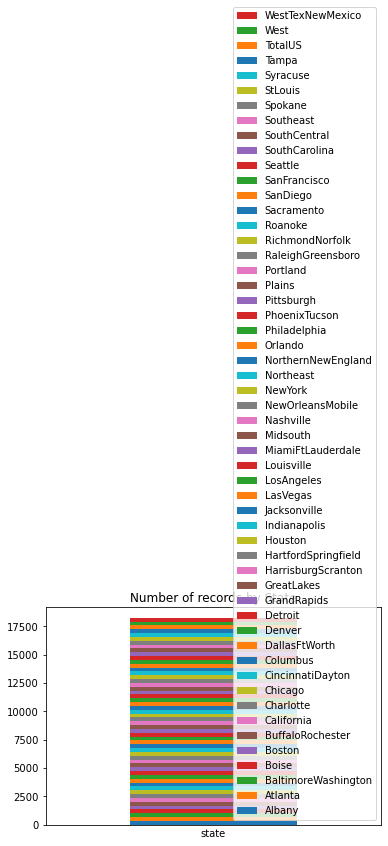

In [11]:
df_product_a.assign(dummy = 1).groupby(['dummy','location']).size().to_frame().unstack().plot(kind='bar',stacked=True,legend=False)

plt.title('Number of records by State')
plt.xlabel('state')

current_handles, _ = plt.gca().get_legend_handles_labels()
reversed_handles = reversed(current_handles)

labels = reversed(df_product_a['location'].unique())

plt.legend(reversed_handles,labels,loc='lower right')
plt.show()

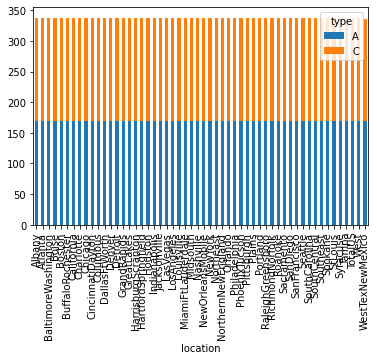

In [12]:
df_product_a.groupby(['location','type']).size().unstack().plot(kind='bar',stacked=True)
plt.show()

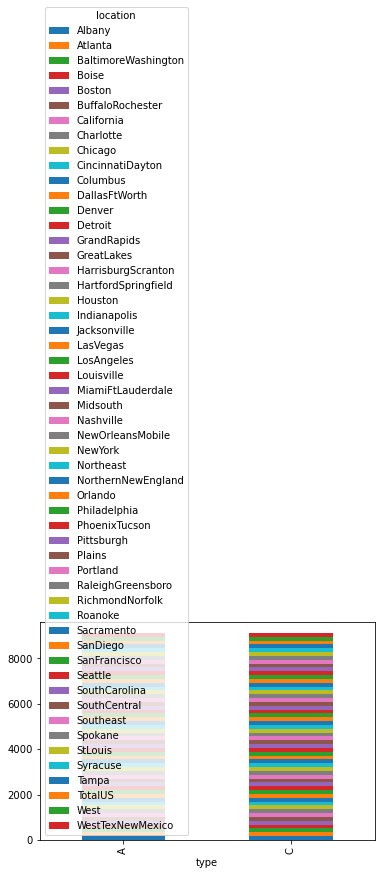

In [13]:
df_product_a.groupby(['type','location']).size().unstack().plot(kind='bar',stacked=True)
plt.show()

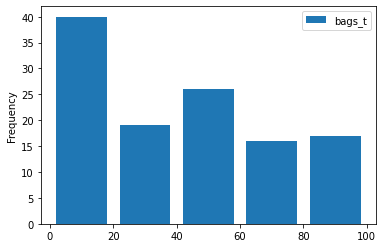

In [17]:
df_product_a[['bags_t']].plot(kind='hist',bins=[0,20,40,60,80,100],rwidth=0.8)
plt.show()

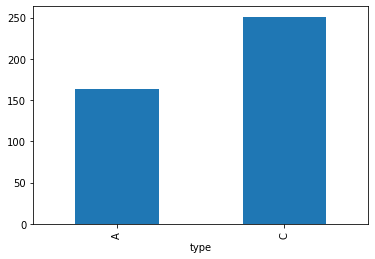

In [22]:
df_product_a.groupby('type')['price'].nunique().plot(kind='bar')
plt.show()

In [57]:
# point 13
df2016 = df_product_a.query('year==2016')


#num_students_size  = [float(each.replace(',', '.')) for each in df2016.plu1]
#international_color = [float(each) for each in df2016.year]

data = [
    {
        'y': df2016.price,
        'x': df2016.location,
        'mode': 'markers',
        'marker': {
          #  'color': international_color
          #  'size': num_students_size,
            'showscale': True
        },
        "text" :  df2016.price
    }
]
#iplot(data)
fig.show()
#py.iplot(fig, filename="file3.html")

In [12]:
newdata5 = go.Scatter(
    x=df_product_a.type,
    y=df_product_a.price,
    name = "type"
)

newdata6 = go.Scatter(
    x=df_product_a.location,
    y=df_product_a.price,
    name = "location"
)

data2 = [newdata5, newdata6]

layout2 = go.Layout(barmode = "group")

fig2 = go.Figure(data = data2, layout = layout2)
#iplot(fig2)

py.iplot(fig2, filename="file4.html")

In [12]:
# point 14


In [7]:
df_product_a_fcopy = df_product_a
df_product_a_fcopy.head()

,date_w,price,total_vol,plu1,plu2,plu3,bags_t,bags_s,bags_l,bags_lx,type,year,location,new_total_vol
0,2016-12-24,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,A,2016,Albany,64236.62
1,2016-12-17,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,A,2016,Albany,54876.98
2,2016-12-10,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,A,2016,Albany,118220.22
3,2016-12-03,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,A,2016,Albany,78992.15
4,2016-11-26,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,A,2016,Albany,51039.60


In [8]:
bags = df_product_a_fcopy.groupby('location')['bags_t'].mean()
bags

location
Albany                 7.929747e+03
Atlanta                8.449856e+04
BaltimoreWashington    1.044561e+05
Boise                  1.597459e+04
Boston                 6.359609e+04
BuffaloRochester       3.435134e+04
California             7.298290e+05
Charlotte              3.460930e+04
Chicago                4.989763e+04
CincinnatiDayton       6.182816e+04
Columbus               2.963428e+04
DallasFtWorth          1.374845e+05
Denver                 1.744290e+05
Detroit                7.177534e+04
GrandRapids            2.712750e+04
GreatLakes             5.283303e+05
HarrisburgScranton     4.002738e+04
HartfordSpringfield    3.352962e+04
Houston                1.485653e+05
Indianapolis           3.544618e+04
Jacksonville           2.875186e+04
LasVegas               5.341122e+04
LosAngeles             4.978240e+05
Louisville             1.963103e+04
MiamiFtLauderdale      6.957527e+04
Midsouth               4.630581e+05
Nashville              3.836440e+04
NewOrleansMobile   

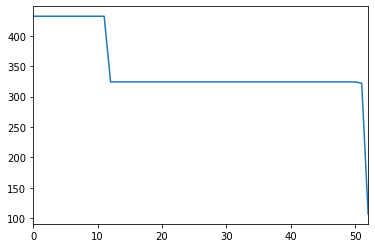

In [18]:
df_product_a_fcopy.groupby(df_product_a_fcopy.index).size().plot()
plt.show()

In [20]:
c_year = df_product_a_fcopy.groupby(['year']).size()
c_year

year
2016    5723
2017    5616
2018    5614
2019    1296
dtype: int64

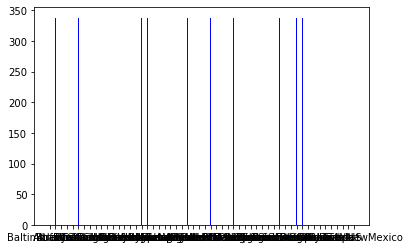

In [28]:
num_bins = 1500
n, bins, patches = plt.hist(df_product_a_fcopy.location, num_bins, facecolor='blue', alpha=1)

In [12]:
# point 14

map = folium.Map(location=[27.813629,  -127.165627], zoom_start= 4)
tooltip = 'Click me!'

folium.Marker([42.654313, -73.759437],popup='Albany',tooltip=tooltip).add_to(map)
folium.Marker([33.113501, -94.165627],popup='Atlanta',tooltip=tooltip).add_to(map)
folium.Marker([39.177437, -76.668768],popup='BaltimoreWashington',tooltip=tooltip).add_to(map)
folium.Marker([43.617127, -116.207129],popup='Boise',tooltip=123).add_to(map)
folium.Marker([42.361975, -71.061618],popup='Boston',tooltip=tooltip).add_to(map)
folium.Marker([43.169413, -77.793925],popup='BuffaloRochester',tooltip=tooltip).add_to(map)
folium.Marker([36.586715, -119.537056],popup='California',tooltip=tooltip).add_to(map)
folium.Marker([35.234245, -80.882445],popup='Charlotte',tooltip=tooltip).add_to(map)
folium.Marker([41.882488, -87.653727],popup='Chicago',tooltip=tooltip).add_to(map)
folium.Marker([39.446888, -84.359446],popup='CincinnatiDayton',tooltip=tooltip).add_to(map)
folium.Marker([39.962618, -83.030696],popup='Columbus',tooltip=tooltip).add_to(map)
folium.Marker([38.892060, -77.019910],popup='DallasFtWorth',tooltip=tooltip).add_to(map)
folium.Marker([39.738449, -104.984848],popup='Denver',tooltip=tooltip).add_to(map)
folium.Marker([42.332939, -83.047836],popup='Detroit',tooltip=tooltip).add_to(map)
folium.Marker([42.963795, -85.670006],popup='GrandRapids',tooltip=tooltip).add_to(map)
folium.Marker([45.052238, -82.484612],popup='GreatLakes',tooltip=tooltip).add_to(map)
folium.Marker([41.411835, -75.665245],popup='HarrisburgScranton',tooltip=tooltip).add_to(map)
folium.Marker([41.763710, -72.685097],popup='HartfordSpringfield',tooltip=tooltip).add_to(map)
folium.Marker([29.749907, -95.358421],popup='Houston',tooltip=tooltip).add_to(map)
folium.Marker([39.791000, -86.148003],popup='Indianapolis',tooltip=tooltip).add_to(map)
folium.Marker([30.332184, -81.655647],popup='Jacksonville',tooltip=tooltip).add_to(map)
folium.Marker([36.114647, -115.172813],popup='LasVegas',tooltip=tooltip).add_to(map)
folium.Marker([34.052235, -118.243683],popup='LosAngeles',tooltip=tooltip).add_to(map)
folium.Marker([38.328732, -85.764771],popup='Louisville',tooltip=tooltip).add_to(map)
folium.Marker([36.174465, -86.767960],popup='Nashville',tooltip=tooltip).add_to(map)
folium.Marker([29.951065, -90.071533],popup='NewOrleansMobile',tooltip=tooltip).add_to(map)
folium.Marker([40.730610, -73.935242],popup='NewYork',tooltip=tooltip).add_to(map)
folium.Marker([44.2033, -70.3039],popup='NorthernNewEngland',tooltip=tooltip).add_to(map)
folium.Marker([28.538336, -81.379234],popup='Orlando',tooltip=tooltip).add_to(map)
folium.Marker([39.952583, -75.165222],popup='Philadelphia ',tooltip=tooltip).add_to(map)
folium.Marker([33.448376, -112.074036],popup='PhoenixTucson',tooltip=tooltip).add_to(map)
folium.Marker([40.440624, -79.995888],popup='Pittsburgh ',tooltip=tooltip).add_to(map)
folium.Marker([41.033985, -73.762909],popup='Plains',tooltip=tooltip).add_to(map)
folium.Marker([45.523064, -122.676483],popup='Portland',tooltip=tooltip).add_to(map)
folium.Marker([36.044659, -79.766235],popup='RaleighGreensboro',tooltip=tooltip).add_to(map)
folium.Marker([37.270969, -79.941429],popup='Roanoke',tooltip=tooltip).add_to(map)
folium.Marker([38.575764, -121.478851],popup='Sacramento',tooltip=tooltip).add_to(map)
folium.Marker([32.715736, -117.161087],popup='SanDiego ',tooltip=tooltip).add_to(map)
folium.Marker([37.773972, -122.431297],popup='SanFrancisco',tooltip=tooltip).add_to(map)
folium.Marker([47.608013, -122.335167],popup='Seattle',tooltip=tooltip).add_to(map)
folium.Marker([33.836082, -81.163727],popup='SouthCarolina',tooltip=tooltip).add_to(map)
folium.Marker([47.65966, -117.42908],popup='Spokane',tooltip=tooltip).add_to(map)
folium.Marker([38.627003, -90.199402],popup='StLouis',tooltip=tooltip).add_to(map)
folium.Marker([43.088947, -76.154480],popup='Syracuse',tooltip=tooltip).add_to(map)
folium.Marker([27.964157, -82.452606],popup='Tampa',tooltip=tooltip).add_to(map)
folium.Marker([36.778259, -119.417931],popup='West',tooltip=tooltip).add_to(map)
folium.Marker([34.5199, 105.8701],popup='WestTexNewMexico',tooltip=tooltip).add_to(map)

map